In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.10.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.8.0'

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    download=True,
    with_info=True,
    as_supervised=True,
)

In [5]:
print(len(raw_train))
print(len(raw_validation))
print(len(raw_test))

2936
367
367


In [6]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

print("슝~")

슝~


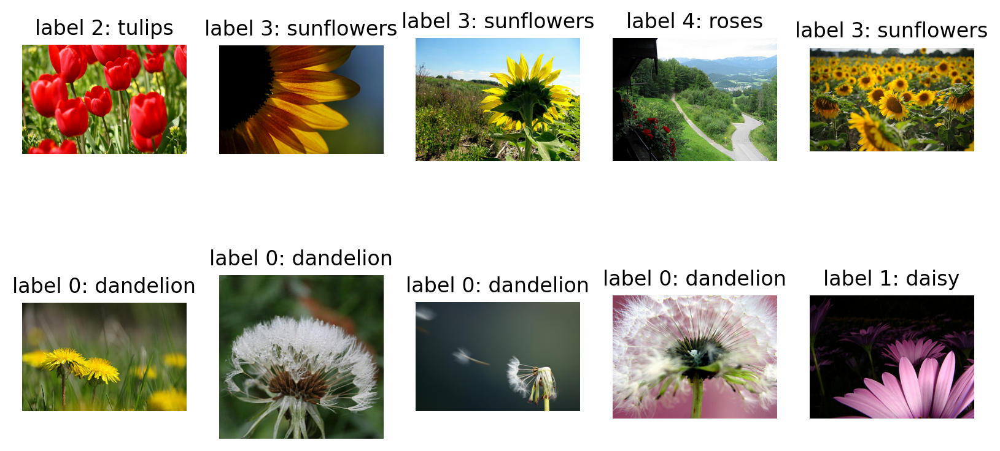

In [7]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [8]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("슝~")

슝~


In [9]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


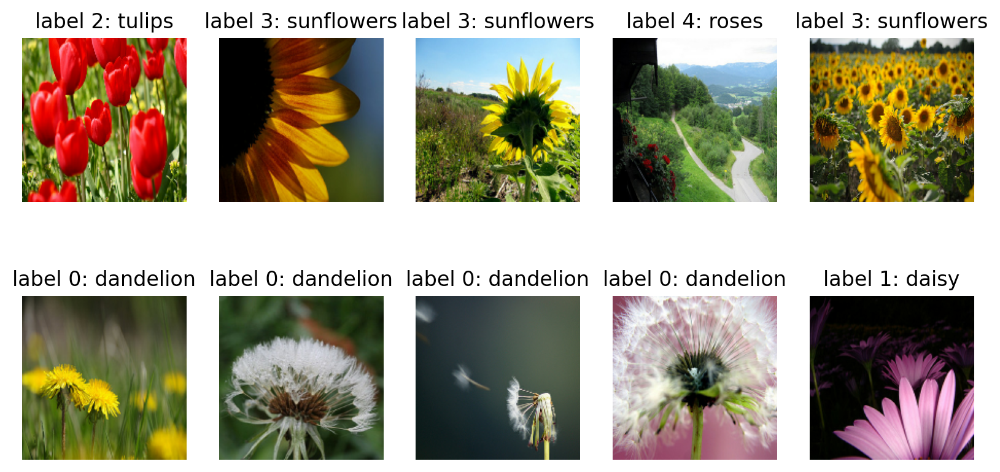

In [10]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

print("슝~")

슝~


In [12]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

print("슝~")

슝~


In [13]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 20, 20, 64)       0

In [14]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("슝~")

슝~


In [15]:
BATCH_SIZE = 20
SHUFFLE_BUFFER_SIZE = 1000
print("슝~")

슝~


In [16]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("슝~")

슝~


In [17]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([20, 160, 160, 3]), TensorShape([20]))

In [18]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

19/20 [===========================>..] - ETA: 0s - loss: 1.6229 - accuracy: 0.1580WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 4s 48ms/step - loss: 1.6229 - accuracy: 0.1580
initial loss: 1.62
initial accuracy: 0.16


In [19]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
147/147 [==============================] - 4s 23ms/step - loss: 1.3266 - accuracy: 0.4428 - val_loss: 1.0613 - val_accuracy: 0.5886
Epoch 2/10
147/147 [==============================] - 3s 23ms/step - loss: 1.0326 - accuracy: 0.5794 - val_loss: 1.0058 - val_accuracy: 0.5940
Epoch 3/10
147/147 [==============================] - 3s 21ms/step - loss: 0.8914 - accuracy: 0.6635 - val_loss: 1.0407 - val_accuracy: 0.5886
Epoch 4/10
147/147 [==============================] - 3s 21ms/step - loss: 0.7562 - accuracy: 0.7316 - val_loss: 1.0873 - val_accuracy: 0.5804
Epoch 5/10
147/147 [==============================] - 3s 22ms/step - loss: 0.6447 - accuracy: 0.7732 - val_loss: 1.1777 - val_accuracy: 0.5450
Epoch 6/10
147/147 [==============================] - 3s 23ms/step - loss: 0.5471 - accuracy: 0.8123 - val_loss: 0.9171 - val_accuracy: 0.6649
Epoch 7/10
147/147 [==============================] - 3s 22ms/step - loss: 0.4472 - accuracy: 0.8542 - val_loss: 0.9769 - val_accuracy: 0.6512

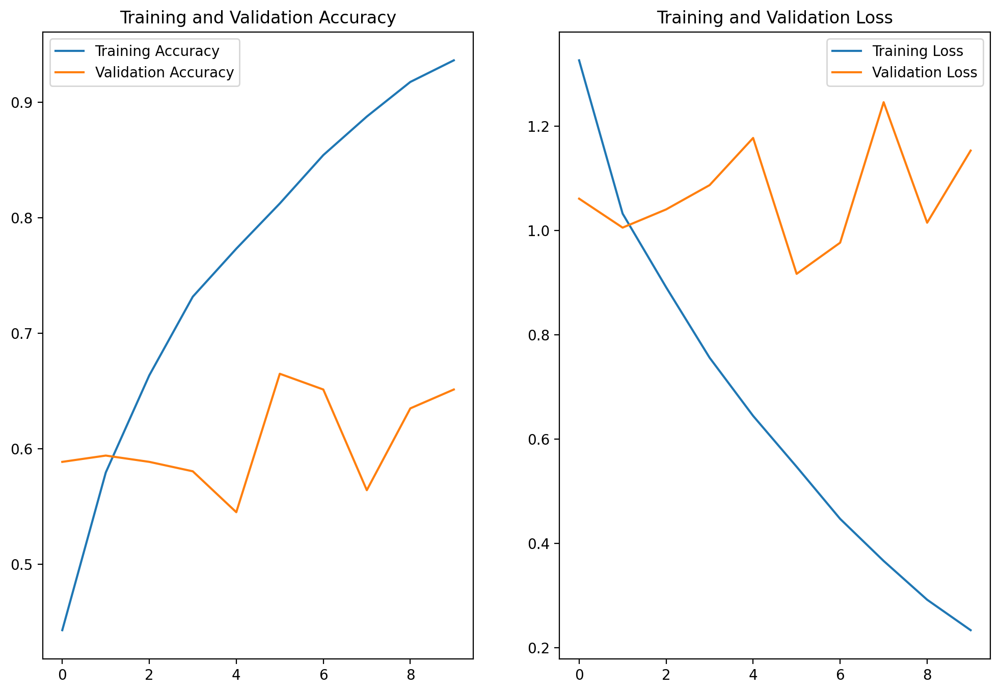

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [21]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

1/1 [==============================] - 0s 79ms/step


array([[5.0173104e-02, 7.4321911e-02, 6.6842115e-01, 1.1449812e-01,
        9.2585728e-02],
       [8.1312501e-01, 1.8550055e-01, 1.0024052e-03, 1.4313224e-05,
        3.5774458e-04],
       [6.8404979e-01, 1.5171626e-02, 3.8887486e-02, 2.6170644e-01,
        1.8460116e-04],
       [4.8698655e-01, 3.5992005e-01, 4.8927244e-02, 1.3897353e-02,
        9.0268791e-02],
       [8.5604924e-01, 9.4086602e-02, 2.7432253e-03, 5.4286729e-04,
        4.6578061e-02],
       [2.9283291e-01, 6.5606773e-01, 6.7686676e-03, 3.7358017e-04,
        4.3957077e-02],
       [9.8071445e-04, 6.2849522e-01, 3.5982627e-01, 7.2706817e-03,
        3.4271108e-03],
       [1.9269656e-01, 7.4479008e-01, 1.0351175e-02, 2.0626310e-02,
        3.1535860e-02],
       [2.8979529e-03, 1.8736906e-05, 1.3955157e-03, 9.9568176e-01,
        6.0502316e-06],
       [9.9480587e-01, 5.0786575e-03, 2.8576591e-05, 1.1998756e-06,
        8.5693442e-05],
       [9.6611220e-01, 3.2721534e-02, 3.8090206e-04, 6.0028462e-05,
        7.25

In [22]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 0, 0, 1, 1, 1, 3, 0, 0, 3, 3, 2, 0, 3, 2, 3, 1, 1],
      dtype=int64)

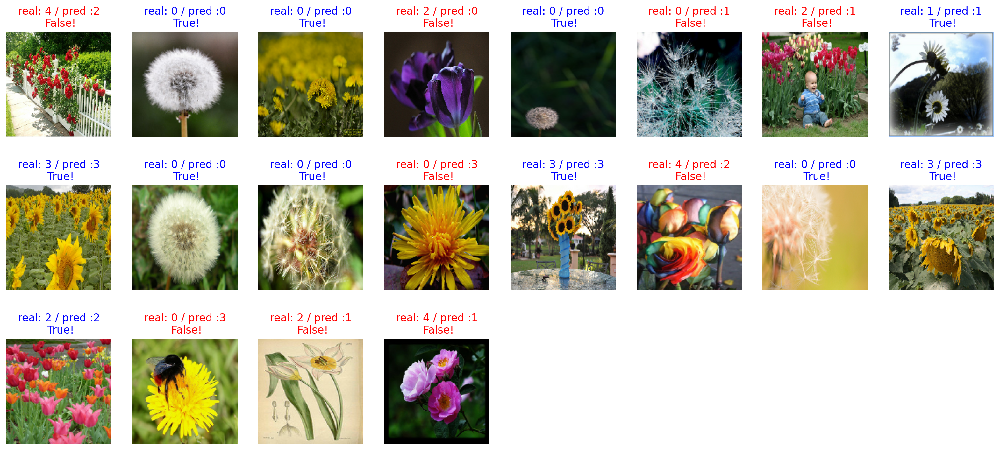

In [23]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [24]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct == True:
        count += 1

print(count / 20 * 100)

55.00000000000001


In [25]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.ResNet50V2(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [26]:
image_batch.shape

TensorShape([20, 160, 160, 3])

In [27]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([20, 5, 5, 2048])

In [28]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 166, 166, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 80, 80, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 82, 82, 64)   0           ['conv1_conv[0][0]']    

In [29]:
feature_batch.shape

TensorShape([20, 5, 5, 2048])

In [30]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
print("슝~")

슝~


In [31]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(20, 2048)


In [32]:
# dense layer에는 unit과 activation 2개의 매개변수만 사용해주세요.
# unit의 값은 위에서 global_average_layer를 통과했을 때의 값을 생각해보세요.
# 활성화 함수는 ReLU를 사용합니다.
dense_layer = tf.keras.layers.Dense(1024, activation='relu')
# unit은 우리가 분류하고 싶은 class를 생각해보세요.
# 활성화 함수는 Softmax를 사용합니다.
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(20, 5)


In [33]:
base_model.trainable = False # True
print("슝~")

슝~


In [34]:
'''
fine_tune_at = 140
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False
    
for i, layer in enumerate(base_model.layers):
  print(i, layer.name, layer.trainable)
'''

'\nfine_tune_at = 140\nfor layer in base_model.layers[:fine_tune_at]:\n    layer.trainable = False\n    \nfor i, layer in enumerate(base_model.layers):\n  print(i, layer.name, layer.trainable)\n'

In [35]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
print("슝~")

슝~


In [36]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 5, 5, 2048)        23564800  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_2 (Dense)             (None, 1024)              2098176   
                                                                 
 dense_3 (Dense)             (None, 5)                 5125      
                                                                 
Total params: 25,668,101
Trainable params: 2,103,301
Non-trainable params: 23,564,800
_________________________________________________________________


In [37]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [38]:
validation_steps=10
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

10/10 [==============================] - 2s 33ms/step - loss: 2.1438 - accuracy: 0.1950
initial loss: 2.14
initial accuracy: 0.19


In [39]:
def apply_augmentation(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.2, upper=1.8)

    return image, label

In [40]:
train_batches = train_batches.map(apply_augmentation)

In [41]:
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

early_stopping_callback = EarlyStopping(
    monitor='val_loss',
    patience=6,
    restore_best_weights=True
)

In [42]:
def learning_rate_scheduler(epoch, learning_rate):
    if epoch%5 == 0:
        return learning_rate * 0.5
    else:
        return learning_rate

In [43]:
lr_scheduler_callback = LearningRateScheduler(learning_rate_scheduler)

In [44]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches,
                    callbacks=[early_stopping_callback, lr_scheduler_callback])

Epoch 1/10
147/147 [==============================] - 10s 46ms/step - loss: 0.8496 - accuracy: 0.6747 - val_loss: 0.5199 - val_accuracy: 0.8038 - lr: 5.0000e-05
Epoch 2/10
147/147 [==============================] - 7s 43ms/step - loss: 0.5329 - accuracy: 0.7967 - val_loss: 0.4399 - val_accuracy: 0.8529 - lr: 5.0000e-05
Epoch 3/10
147/147 [==============================] - 6s 43ms/step - loss: 0.4454 - accuracy: 0.8375 - val_loss: 0.4458 - val_accuracy: 0.8365 - lr: 5.0000e-05
Epoch 4/10
147/147 [==============================] - 7s 45ms/step - loss: 0.3882 - accuracy: 0.8587 - val_loss: 0.4030 - val_accuracy: 0.8638 - lr: 5.0000e-05
Epoch 5/10
147/147 [==============================] - 7s 43ms/step - loss: 0.3524 - accuracy: 0.8696 - val_loss: 0.3836 - val_accuracy: 0.8692 - lr: 5.0000e-05
Epoch 6/10
147/147 [==============================] - 7s 44ms/step - loss: 0.3016 - accuracy: 0.8937 - val_loss: 0.3708 - val_accuracy: 0.8638 - lr: 2.5000e-05
Epoch 7/10
147/147 [===================

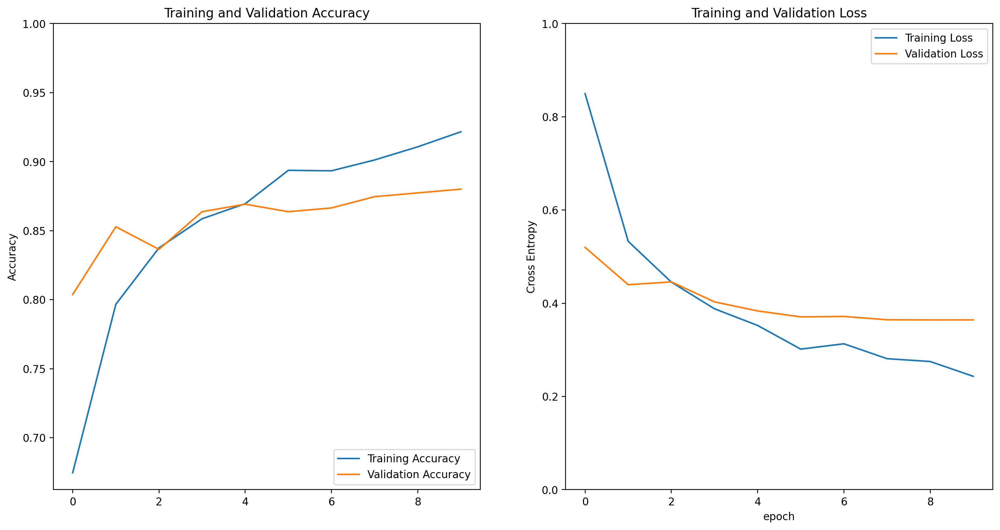

In [45]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [46]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 1s 558ms/step


array([[2.25864560e-03, 3.34890671e-02, 9.03674603e-01, 1.99792571e-02,
        4.05983701e-02],
       [9.99991417e-01, 6.49050980e-06, 1.89186926e-06, 5.69030902e-08,
        1.95862825e-07],
       [6.51804090e-01, 2.29660999e-02, 8.96073058e-02, 2.22997159e-01,
        1.26253730e-02],
       [6.75743795e-04, 9.60964486e-02, 7.35253692e-01, 3.23934888e-04,
        1.67650133e-01],
       [9.95073736e-01, 4.46510315e-03, 3.04871846e-05, 1.97153146e-04,
        2.33537095e-04],
       [9.92109001e-01, 6.46631233e-03, 4.66369704e-04, 3.22296924e-04,
        6.36056298e-04],
       [5.88452537e-03, 1.92621478e-03, 8.07158232e-01, 1.79164827e-01,
        5.86631196e-03],
       [2.50759304e-01, 3.08982462e-01, 1.85641431e-04, 4.37873036e-01,
        2.19957484e-03],
       [1.52911646e-02, 4.56615631e-03, 4.29408215e-02, 9.34502482e-01,
        2.69945874e-03],
       [9.98370230e-01, 1.25614018e-03, 8.73802855e-05, 4.71441017e-05,
        2.39244968e-04],
       [9.98294175e-01, 1.1987

In [47]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 3, 3, 0, 0, 0, 3, 4, 0, 3, 2, 0, 2, 4],
      dtype=int64)

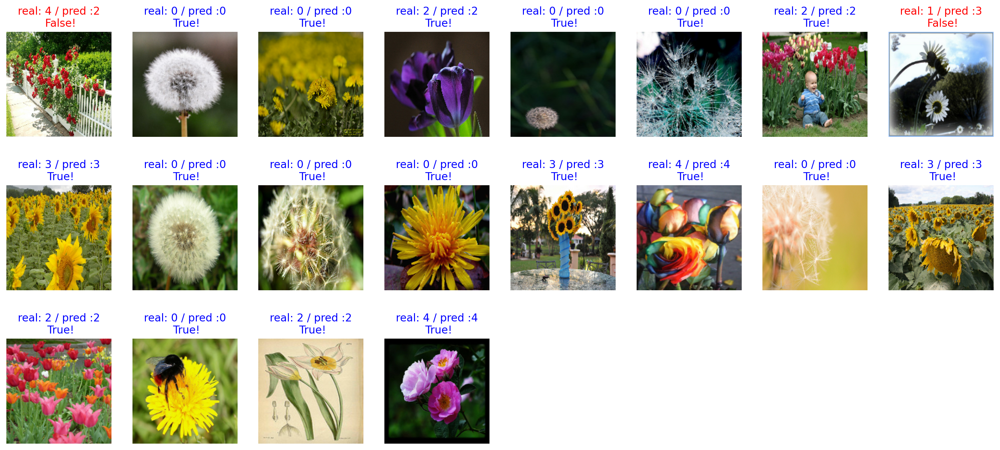

In [48]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [49]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 20 * 100)

90.0


In [51]:
test_loss, test_accuracy = model.evaluate(test_batches)

19/19 [==============================] - 1s 24ms/step - loss: 0.3965 - accuracy: 0.8692
